<a href="https://colab.research.google.com/github/sgevatschnaider/CriptografiayBlockchain/blob/main/1_Fundamentos_Criptografia/Ramunajan_y_Grafo_de_Ptersen.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

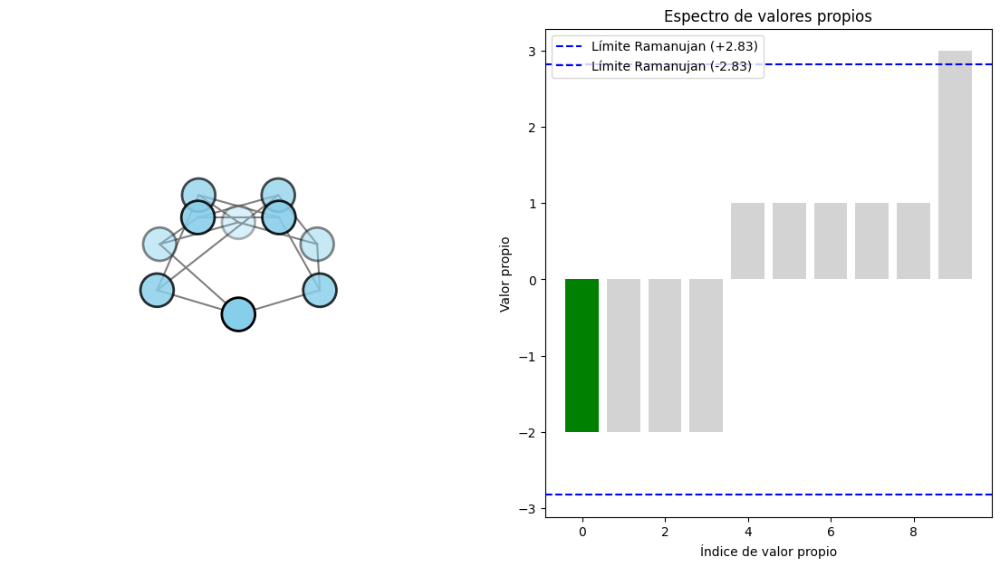

In [ ]:
dimport networkx as nx
import matplotlib.pyplot as plt
import numpy as np
from matplotlib import animation
from mpl_toolkits.mplot3d import Axes3D
from IPython.display import HTML
from google.colab import files

# Crear el Grafo de Petersen y verificar la estructura
G = nx.petersen_graph()
assert len(G.nodes) == 10, "El grafo debe tener 10 nodos para ser el grafo de Petersen."
assert len(G.edges) == 15, "El grafo debe tener 15 aristas para ser el grafo de Petersen."

# Definir posiciones en 3D manualmente para los nodos del Grafo de Petersen
# Nota: Asegúrate de que las posiciones reflejan la estructura de Petersen, no la de icosaedro
pos_3d = {
    0: (1, 0, 0),  1: (0.5, 0.87, 0),  2: (-0.5, 0.87, 0),  3: (-1, 0, 0),  4: (-0.5, -0.87, 0),
    5: (0.5, -0.87, 0),  6: (0.25, 0.43, 1),  7: (-0.25, 0.43, 1),  8: (-0.25, -0.43, 1),  9: (0.25, -0.43, 1)
}

# Calcular la matriz de adyacencia y sus valores propios
adj_matrix = nx.adjacency_matrix(G).todense()
eigenvalues = np.sort(np.real(np.linalg.eigvals(adj_matrix)))

# Parámetros de Ramanujan
k = 3  # Grado del grafo (3-regular)
ramanujan_bound = 2 * np.sqrt(k - 1)

# Crear la figura y los ejes
fig = plt.figure(figsize=(14, 7))
ax_graph = fig.add_subplot(121, projection='3d')  # Eje 3D para el grafo
ax_spectrum = fig.add_subplot(122)                # Eje 2D para el espectro de valores propios

# Función para dibujar el Grafo de Petersen en 3D
def draw_graph(ax, pos, angle):
    ax.clear()
    for edge in G.edges():
        x = [pos[edge[0]][0], pos[edge[1]][0]]
        y = [pos[edge[0]][1], pos[edge[1]][1]]
        z = [pos[edge[0]][2], pos[edge[1]][2]]
        ax.plot(x, y, z, color='gray', linewidth=1.5)

    # Dibujar los nodos
    xs = [pos[node][0] for node in G.nodes()]
    ys = [pos[node][1] for node in G.nodes()]
    zs = [pos[node][2] for node in G.nodes()]
    ax.scatter(xs, ys, zs, color='skyblue', s=700, edgecolors='black', linewidths=2)

    # Configuración de los ejes
    ax.set_xlim(-1.5, 1.5)
    ax.set_ylim(-1.5, 1.5)
    ax.set_zlim(-1.5, 1.5)
    ax.set_axis_off()
    ax.view_init(elev=30, azim=angle)

# Función para actualizar la gráfica del espectro de valores propios y el grafo en cada paso de la animación
def update(frame, ax_graph, ax_spectrum, pos, eigenvalues, ramanujan_bound):
    angle = frame * 3  # Cambiar el ángulo de rotación en cada frame

    # Actualizar el grafo en 3D con rotación
    draw_graph(ax_graph, pos, angle)

    # Actualizar la gráfica de valores propios
    ax_spectrum.clear()
    ax_spectrum.bar(range(len(eigenvalues)), eigenvalues, color='lightgray')

    # Resaltar el valor propio actual
    if frame < len(eigenvalues):
        color = 'green' if abs(eigenvalues[frame]) <= ramanujan_bound else 'red'
        ax_spectrum.bar(frame, eigenvalues[frame], color=color)

    # Dibujar las líneas de límite de Ramanujan
    ax_spectrum.axhline(y=ramanujan_bound, color='blue', linestyle='--', label=f'Límite Ramanujan (+{ramanujan_bound:.2f})')
    ax_spectrum.axhline(y=-ramanujan_bound, color='blue', linestyle='--', label=f'Límite Ramanujan (-{ramanujan_bound:.2f})')

    # Configuración de la gráfica de valores propios
    ax_spectrum.set_xlabel("Índice de valor propio")
    ax_spectrum.set_ylabel("Valor propio")
    ax_spectrum.set_title("Espectro de valores propios")
    ax_spectrum.legend()

# Crear la animación
frames = len(eigenvalues) + 30  # Mostrar algunos frames adicionales al final
ani = animation.FuncAnimation(fig, update, frames=frames, fargs=(ax_graph, ax_spectrum, pos_3d, eigenvalues, ramanujan_bound), interval=500, blit=False)

# Guardar la animación como GIF y MP4
ani.save('petersen_ramanujan_animation.gif', writer='pillow', fps=10)
ani.save('petersen_ramanujan_animation.mp4', writer='ffmpeg', fps=10)

# Descargar los archivos generados (si estás en Google Colab)
files.download('petersen_ramanujan_animation.gif')
files.download('petersen_ramanujan_animation.mp4')

# Mostrar la animación en el notebook
HTML(ani.to_jshtml())


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

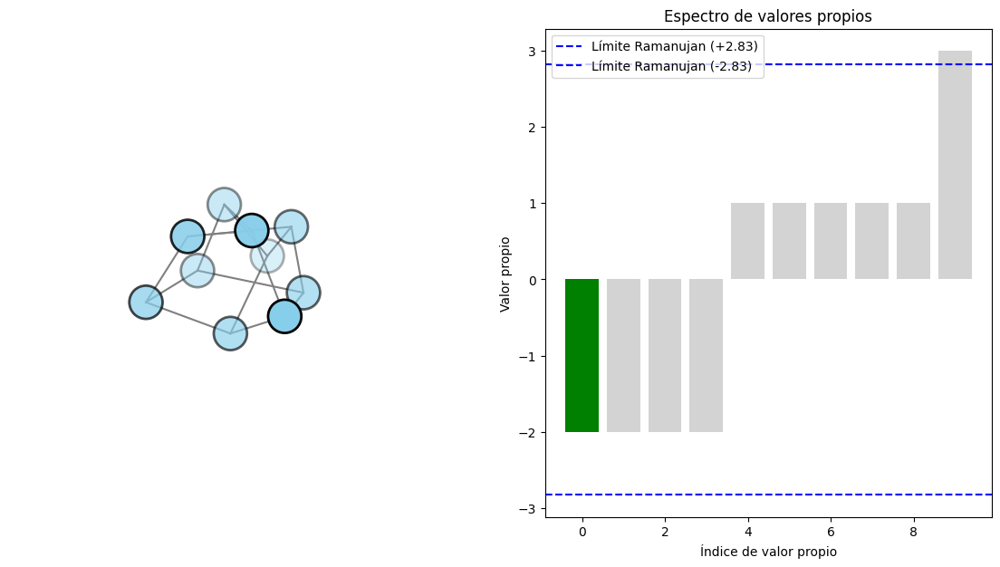

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
from matplotlib import animation
from mpl_toolkits.mplot3d import Axes3D
from IPython.display import HTML
from google.colab import files

# Crear el Grafo de Petersen y verificar su estructura
G = nx.petersen_graph()
assert len(G.nodes) == 10, "El grafo debe tener 10 nodos para ser el grafo de Petersen."
assert len(G.edges) == 15, "El grafo debe tener 15 aristas para ser el grafo de Petersen."

# Generar posiciones en 3D para los nodos automáticamente
pos_3d = nx.spring_layout(G, dim=3, seed=42)  # Disposición en 3D automática

# Calcular la matriz de adyacencia y sus valores propios
adj_matrix = nx.adjacency_matrix(G).todense()
eigenvalues = np.sort(np.real(np.linalg.eigvals(adj_matrix)))

# Parámetros de Ramanujan
k = 3  # Grado del grafo (3-regular)
ramanujan_bound = 2 * np.sqrt(k - 1)

# Crear la figura y los ejes
fig = plt.figure(figsize=(14, 7))
ax_graph = fig.add_subplot(121, projection='3d')  # Eje 3D para el grafo
ax_spectrum = fig.add_subplot(122)                # Eje 2D para el espectro de valores propios

# Función para dibujar el Grafo de Petersen en 3D
def draw_graph(ax, pos, angle):
    ax.clear()
    for edge in G.edges():
        x, y, z = zip(pos[edge[0]], pos[edge[1]])
        ax.plot(x, y, z, color='gray', linewidth=1.5)

    # Dibujar los nodos
    xs, ys, zs = zip(*[pos[node] for node in G.nodes()])
    ax.scatter(xs, ys, zs, color='skyblue', s=700, edgecolors='black', linewidths=2)

    # Configuración de los ejes
    ax.set_xlim(-1.5, 1.5)
    ax.set_ylim(-1.5, 1.5)
    ax.set_zlim(-1.5, 1.5)
    ax.set_axis_off()
    ax.view_init(elev=30, azim=angle)

# Función para actualizar el espectro de valores propios
def update_spectrum(ax, frame, eigenvalues, ramanujan_bound):
    ax.clear()
    ax.bar(range(len(eigenvalues)), eigenvalues, color='lightgray')

    # Resaltar el valor propio actual
    if frame < len(eigenvalues):
        color = 'green' if abs(eigenvalues[frame]) <= ramanujan_bound else 'red'
        ax.bar(frame, eigenvalues[frame], color=color)

    # Dibujar las líneas de límite de Ramanujan
    ax.axhline(y=ramanujan_bound, color='blue', linestyle='--', label=f'Límite Ramanujan (+{ramanujan_bound:.2f})')
    ax.axhline(y=-ramanujan_bound, color='blue', linestyle='--', label=f'Límite Ramanujan (-{ramanujan_bound:.2f})')
    ax.set_xlabel("Índice de valor propio")
    ax.set_ylabel("Valor propio")
    ax.set_title("Espectro de valores propios")
    ax.legend()

# Función para actualizar el grafo y el espectro en cada frame de la animación
def update(frame, ax_graph, ax_spectrum, pos, eigenvalues, ramanujan_bound):
    angle = frame * 3  # Rotación progresiva
    draw_graph(ax_graph, pos, angle)
    update_spectrum(ax_spectrum, frame, eigenvalues, ramanujan_bound)

# Crear la animación
frames = len(eigenvalues) + 30  # Mostrar algunos frames adicionales al final
ani = animation.FuncAnimation(fig, update, frames=frames, fargs=(ax_graph, ax_spectrum, pos_3d, eigenvalues, ramanujan_bound), interval=500, blit=False)

# Guardar la animación como GIF y MP4
ani.save('petersen_ramanujan_animation.gif', writer='pillow', fps=10)
ani.save('petersen_ramanujan_animation.mp4', writer='ffmpeg', fps=10)

# Descargar los archivos generados (si estás en Google Colab)
files.download('petersen_ramanujan_animation.gif')
files.download('petersen_ramanujan_animation.mp4')

# Mostrar la animación en el notebook
HTML(ani.to_jshtml())


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

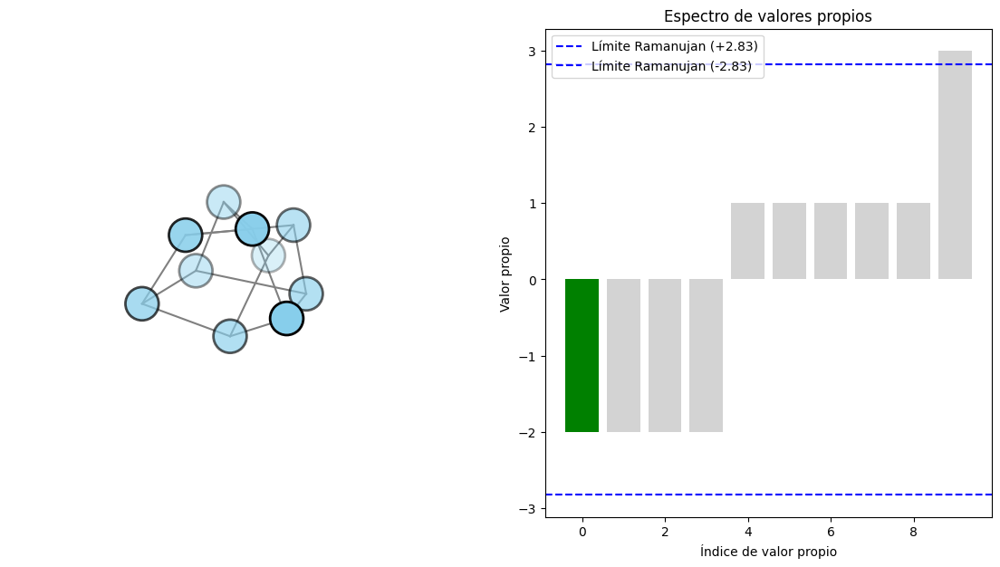

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
from matplotlib import animation
from mpl_toolkits.mplot3d import Axes3D
from IPython.display import HTML
from google.colab import files
import subprocess

# Crear el Grafo de Petersen y verificar su estructura
G = nx.petersen_graph()
assert len(G.nodes) == 10, "El grafo debe tener 10 nodos para ser el grafo de Petersen."
assert len(G.edges) == 15, "El grafo debe tener 15 aristas para ser el grafo de Petersen."

# Generar posiciones en 3D para los nodos automáticamente
pos_3d = nx.spring_layout(G, dim=3, seed=42)  # Disposición en 3D automática

# Calcular la matriz de adyacencia y sus valores propios
adj_matrix = nx.adjacency_matrix(G).todense()
eigenvalues = np.sort(np.real(np.linalg.eigvals(adj_matrix)))

# Parámetros de Ramanujan
k = 3  # Grado del grafo (3-regular)
ramanujan_bound = 2 * np.sqrt(k - 1)

# Crear la figura y los ejes
fig = plt.figure(figsize=(14, 7))
ax_graph = fig.add_subplot(121, projection='3d')  # Eje 3D para el grafo
ax_spectrum = fig.add_subplot(122)                # Eje 2D para el espectro de valores propios

# Función para dibujar el Grafo de Petersen en 3D
def draw_graph(ax, pos, angle):
    ax.clear()
    for edge in G.edges():
        x, y, z = zip(pos[edge[0]], pos[edge[1]])
        ax.plot(x, y, z, color='gray', linewidth=1.5)

    # Dibujar los nodos
    xs, ys, zs = zip(*[pos[node] for node in G.nodes()])
    ax.scatter(xs, ys, zs, color='skyblue', s=700, edgecolors='black', linewidths=2)

    # Configuración de los ejes
    ax.set_xlim(-1.5, 1.5)
    ax.set_ylim(-1.5, 1.5)
    ax.set_zlim(-1.5, 1.5)
    ax.set_axis_off()
    ax.view_init(elev=30, azim=angle)

# Función para actualizar el espectro de valores propios
def update_spectrum(ax, frame, eigenvalues, ramanujan_bound):
    ax.clear()
    ax.bar(range(len(eigenvalues)), eigenvalues, color='lightgray')

    # Resaltar el valor propio actual
    if frame < len(eigenvalues):
        color = 'green' if abs(eigenvalues[frame]) <= ramanujan_bound else 'red'
        ax.bar(frame, eigenvalues[frame], color=color)

    # Dibujar las líneas de límite de Ramanujan
    ax.axhline(y=ramanujan_bound, color='blue', linestyle='--', label=f'Límite Ramanujan (+{ramanujan_bound:.2f})')
    ax.axhline(y=-ramanujan_bound, color='blue', linestyle='--', label=f'Límite Ramanujan (-{ramanujan_bound:.2f})')
    ax.set_xlabel("Índice de valor propio")
    ax.set_ylabel("Valor propio")
    ax.set_title("Espectro de valores propios")
    ax.legend()

# Función para actualizar el grafo y el espectro en cada frame de la animación
def update(frame, ax_graph, ax_spectrum, pos, eigenvalues, ramanujan_bound):
    angle = frame * 3  # Rotación progresiva
    draw_graph(ax_graph, pos, angle)
    update_spectrum(ax_spectrum, frame, eigenvalues, ramanujan_bound)

# Crear la animación
frames = len(eigenvalues) + 30  # Mostrar algunos frames adicionales al final
ani = animation.FuncAnimation(fig, update, frames=frames, fargs=(ax_graph, ax_spectrum, pos_3d, eigenvalues, ramanujan_bound), interval=500, blit=False)

# Guardar la animación como un archivo MP4 inicial
ani.save('petersen_ramanujan_animation.mp4', writer='ffmpeg', fps=10)

# Crear una versión en bucle continuo del archivo MP4 usando ffmpeg
looped_filename = 'petersen_ramanujan_loop.mp4'
subprocess.run(['ffmpeg', '-y', '-stream_loop', '-1', '-i', 'petersen_ramanujan_animation.mp4', '-c', 'copy', looped_filename])

# Descargar los archivos generados (si estás en Google Colab)
files.download('petersen_ramanujan_animation.mp4')
files.download(looped_filename)

# Mostrar la animación en el notebook
HTML(ani.to_jshtml())
